<a href="https://colab.research.google.com/github/olonok69/LLM_Notebooks/blob/main/image/operations/crop_rotation/Cropping_and_Rotating_Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# What is a Pixel

Each pixel represents vital information about color and brightness, collectively forming the visual representation. In grayscale images, a pixel’s intensity value denotes its brightness on a scale from 0 (black) to 255 (white) within an 8-bit system. For colored images, pixels contain information for three primary color channels: Red (R), Green (G), and Blue (B), with each channel’s intensity ranging from 0 to 255. Different combinations of these values produce a diverse spectrum of colors. For instance, full intensity in all channels (255, 255, 255) results in white, while no intensity in any channel (0, 0, 0) yields black

# Pixel Per inch

A pixel is one of the small dots or squares that make up an image on a computer screen. The more pixels there are, the more the image looks real or accurate. Any digital image is made up of pixels, and when someone talks about the resolution of a computer monitor or TV screen, they're referring to the number of pixels.


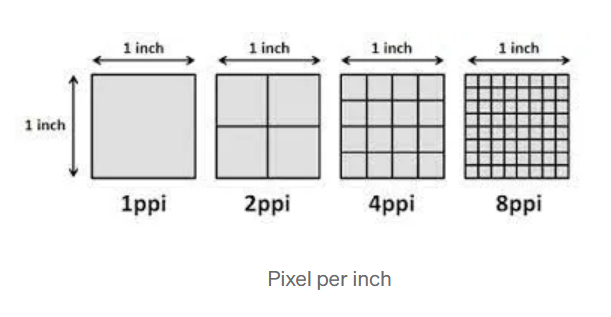


# Dots per Inch
What does DPI stand for? DPI stands for Dots per Inch, referring to the number of ink droplets a printer will produce per inch while printing an image. The more dots of ink per inch the picture has, the more detail you will see when printed.

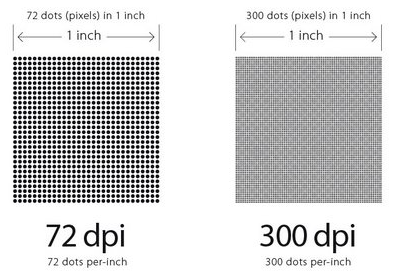

#RGB
Red (R): Controls the presence of red light in the color spectrum. Maximum intensity (255, 0, 0) yields pure red, while absence (0, 0, 0) results in black.

Green (G): Dictates the degree of green light. Full intensity (0, 255, 0) produces pure green, while no intensity (0, 0, 0) leads to black.

Blue (B): Controls the amount of blue light. Maximum intensity (0, 0, 255) produces pure blue, while absence (0, 0, 0) results in black.

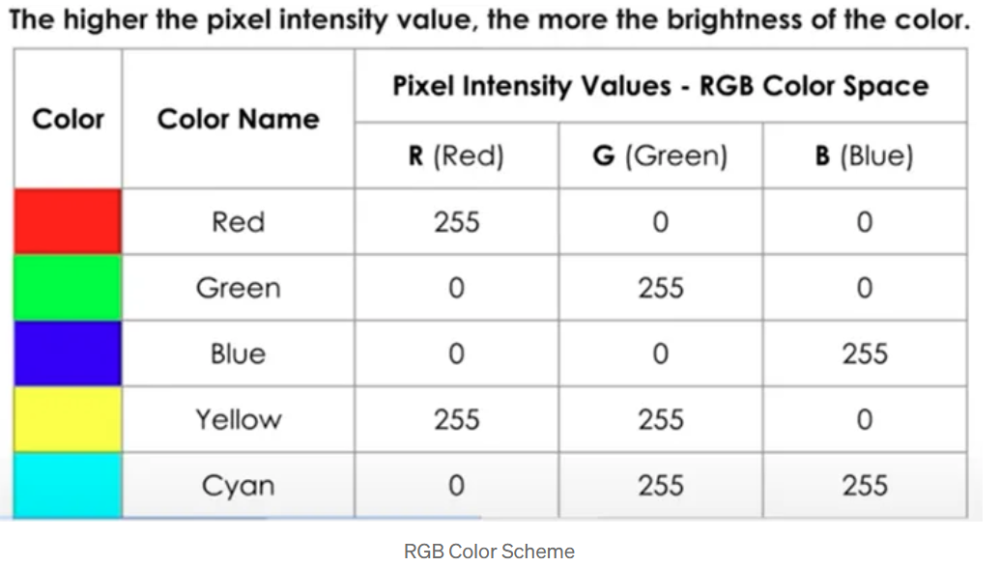


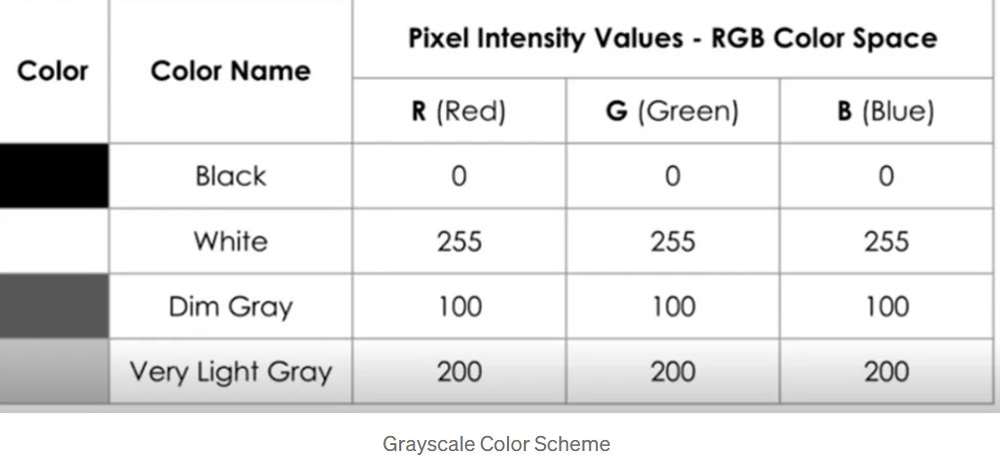

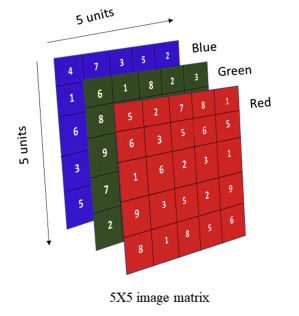

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt


In [3]:
image1 = '/content/drive/MyDrive/data/images/images/check.tif'
image2= "/content/drive/MyDrive/data/images/images/zermatt.jpg"

In [6]:
image = cv2.imread(image2)
image.shape

(1000, 1500, 3)

In [18]:
image[0][0]

array([255, 249, 250], dtype=uint8)

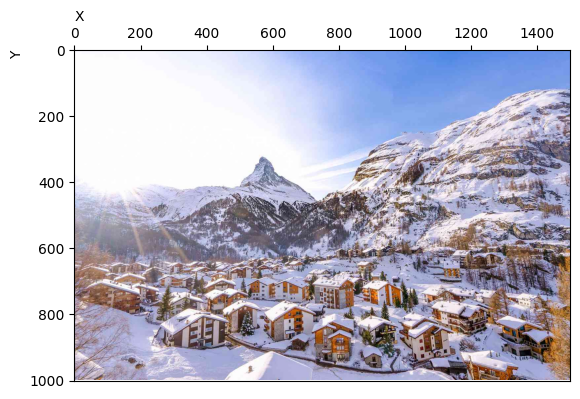

In [8]:
def plot_image_in_matrix(image_path):
    """
    Loads an image, converts it to a NumPy array, and plots it with
    a coordinate system representing width and height, with the origin
    (0, 0) at the upper-left corner, and without rotating the image.
    Corrected coordinate system.

    Args:
        image_path (str): Path to the image file.
    """
    try:
        img = Image.open(image_path)
        img_array = np.array(img)

        height, width, channels = img_array.shape if len(img_array.shape) == 3 else (img_array.shape[0],img_array.shape[1], 1)

        plt.figure(figsize=(width / 100, height / 100))
        plt.imshow(img_array, origin='upper')

        plt.xlabel("Width (pixels)")
        plt.ylabel("Height (pixels)")
        plt.title("Image Plot with Width and Height Coordinates (Origin: Upper-Left, Final)")

        # Set axis limits to match image dimensions
        plt.xlim(0, width)
        plt.ylim(height, 0) #Y axis is inverted.

        plt.show()

    except FileNotFoundError:
        print(f"Error: Image file not found at '{image_path}'")
    except Exception as e:
        print(f"An error occurred: {e}")

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image
img = mpimg.imread(image2)

# Create the plot
fig, ax = plt.subplots()

# Display the image
ax.imshow(img)

# Set the axis limits and labels
ax.set_xlim(0, img.shape[1])  # x-axis limits from 0 to image width
ax.set_ylim(img.shape[0], 0)  # y-axis limits from image height to 0 (inverted)
ax.set_xlabel('X', loc='left')  # x-axis label on the top-left
ax.set_ylabel('Y', loc='top')  # y-axis label on the top-left

# Set the tick positions and labels
ax.xaxis.tick_top()  # Move x-axis ticks to the top
ax.xaxis.set_label_position('top')  # Move x-axis label to the top
ax.yaxis.tick_left()  # Move y-axis ticks to the left

# Show the plot
plt.show()

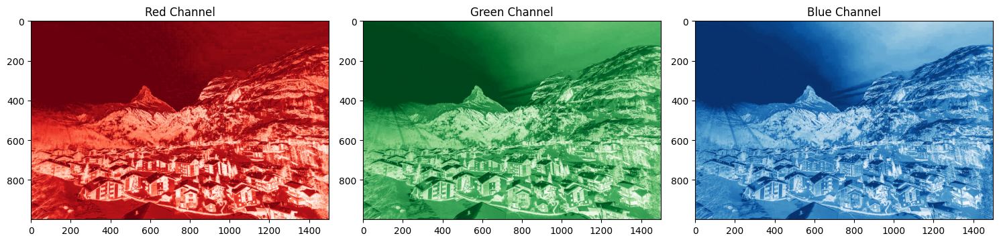

In [9]:
import cv2

# Load the image
img = cv2.imread(image2)

# Extract the color channels
red_channel = img[:,:,0]
green_channel = img[:,:,1]
blue_channel = img[:,:,2]

# Create subplots in a single row
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Plot the red channel
axes[0].imshow(red_channel, cmap='Reds')
axes[0].set_title('Red Channel')

# Plot the green channel
axes[1].imshow(green_channel, cmap='Greens')
axes[1].set_title('Green Channel')

# Plot the blue channel
axes[2].imshow(blue_channel, cmap='Blues')
axes[2].set_title('Blue Channel')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

# Cropping
Cropping an image with OpenCV is accomplished via simple NumPy
array slices in startY:endY, startX:endX order -- here we are
cropping the face from the image (these coordinates were
determined using photo editing software such as Photoshop,
GIMP, Paint, etc.)

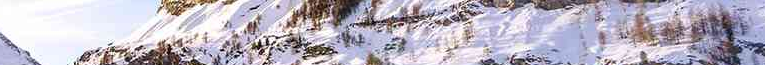

In [10]:
cv2_imshow(image[385:450, 685:1450])

# Rotation

https://docs.opencv.org/3.4/da/d54/group__imgproc__transform.html#gafbbc470ce83812914a70abfb604f4326


# Warp affine transformation
 in an image refers to a geometric transformation that involves affine transformations to alter the image. 1  Affine transformations preserve parallel lines and ratios of distances between points on a line. 2  In simpler terms, it means that after applying a warp affine transformation, parallel lines in the original image will remain parallel in the transformed image

https://docs.opencv.org/3.4/da/d54/group__imgproc__transform.html#ga0203d9ee5fcd28d40dbc4a1ea4451983

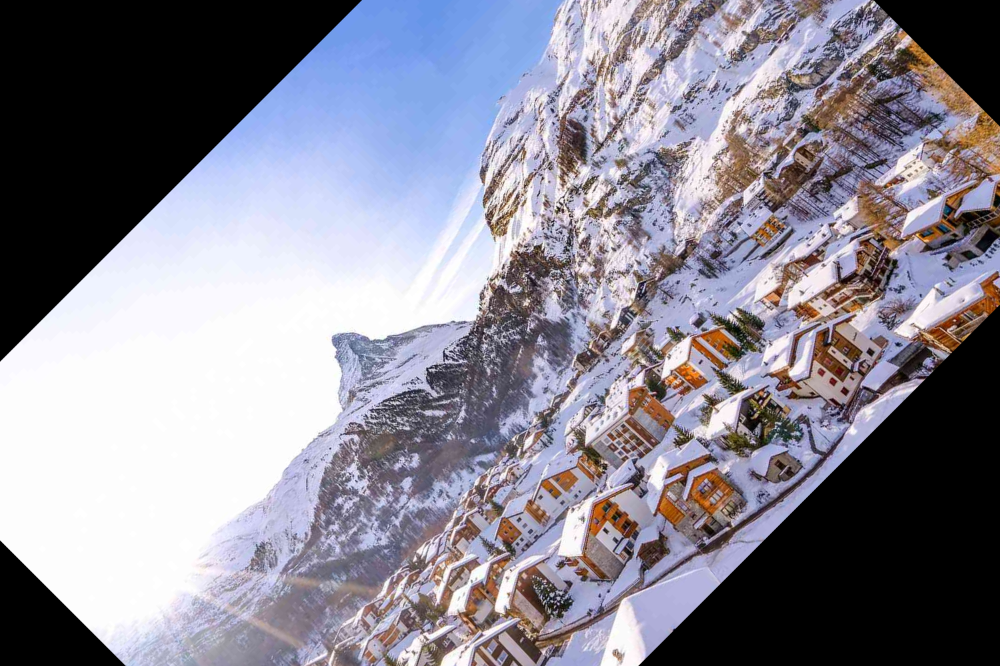

In [11]:
# load the image and show it
image = cv2.imread(image2)


# grab the dimensions of the image and calculate the center of the
# image
(h, w) = image.shape[:2]
(cX, cY) = (w // 2, h // 2)

# rotate our image by 45 degrees around the center of the image
M = cv2.getRotationMatrix2D((cX, cY), 45, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow( rotated)

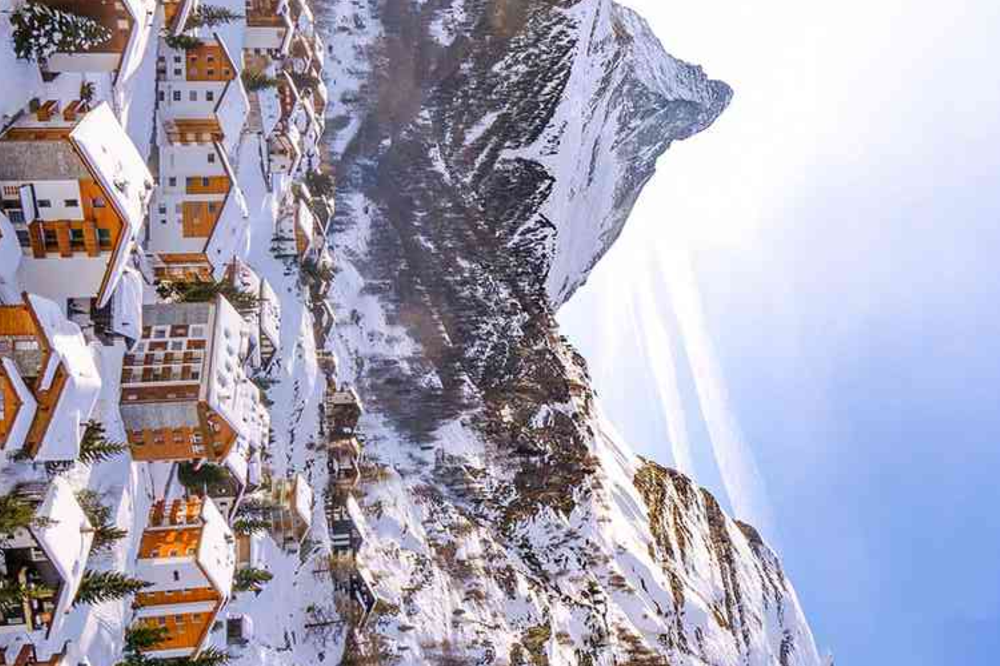

In [12]:
# rotate our image by -90 degrees around the image
M = cv2.getRotationMatrix2D((cX, cY), -90, 2.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow( rotated)

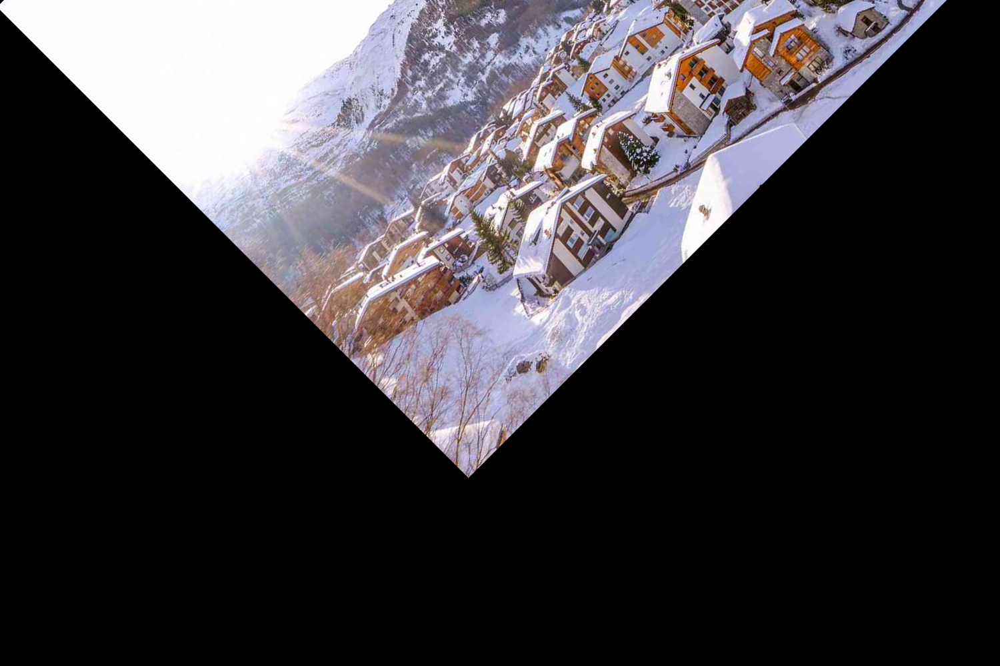

In [13]:
# rotate our image around an arbitrary point rather than the center
M = cv2.getRotationMatrix2D((10, 10), 45, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow(  rotated)

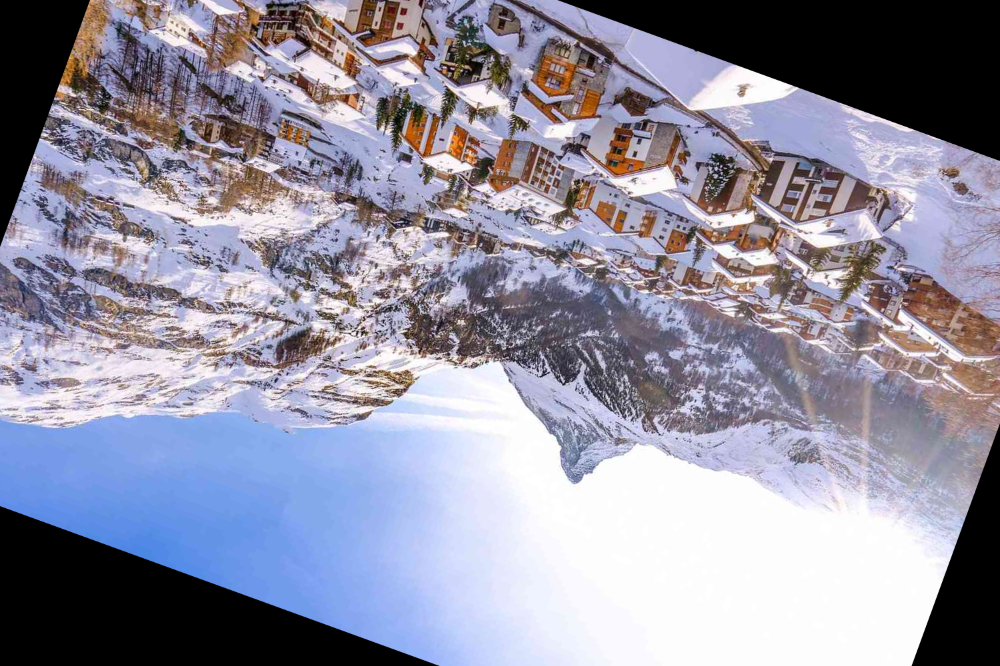

In [14]:
import imutils

rotated = imutils.rotate(image, 160)
cv2_imshow( rotated)